  Using cached pip-24.0-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.0-py3-none-any.whl (2.1 MB)
  Attempting uninstall: pip
    Found existing installation: pip 23.3.2
    Uninstalling pip-23.3.2:
      Successfully uninstalled pip-23.3.2
  Using cached mxnet-1.9.1-py3-none-manylinux2014_x86_64.whl.metadata (3.4 kB)
  Using cached bokeh-2.0.1-py3-none-any.whl
  Using cached graphviz-0.8.4-py2.py3-none-any.whl.metadata (6.4 kB)
Using cached mxnet-1.9.1-py3-none-manylinux2014_x86_64.whl (49.1 MB)
Using cached graphviz-0.8.4-py2.py3-none-any.whl (16 kB)
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.20.3
    Uninstalling graphviz-0.20.3:
      Successfully uninstalled graphviz-0.20.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.1/98.1 kB 118.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 M

In [18]:
!echo '{"username":"USERNAME","key":"KEY"}' > ~/.kaggle/kaggle.json

In [19]:
!mkdir -p .kaggle
!touch .kaggle/kaggle.json
!chmod 600 .kaggle/kaggle.json

In [20]:
import json
kaggle_username = "divyachauhan3301"
kaggle_key = "eb781f878f360e585e1aeb9e7828a87d"

# Save API token the kaggle.json file
with open(".kaggle/kaggle.json", "w") as f:
    f.write(json.dumps({"username": kaggle_username, "key": kaggle_key}))

In [21]:
import pandas as pd
from autogluon.tabular import TabularPredictor

In [22]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sampleSubmission.csv')

In [23]:
train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [24]:
test.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed
0,2011-01-20 00:00:00,1,0,1,1,10.66,11.365,56,26.0027
1,2011-01-20 01:00:00,1,0,1,1,10.66,13.635,56,0.0000
2,2011-01-20 02:00:00,1,0,1,1,10.66,13.635,56,0.0000
3,2011-01-20 03:00:00,1,0,1,1,10.66,12.880,56,11.0014
4,2011-01-20 04:00:00,1,0,1,1,10.66,12.880,56,11.0014


In [25]:
submission.head()

,datetime,count
0,2011-01-20 00:00:00,0
1,2011-01-20 01:00:00,0
2,2011-01-20 02:00:00,0
3,2011-01-20 03:00:00,0
4,2011-01-20 04:00:00,0


In [ ]:
predictor = TabularPredictor(
    label="count", problem_type="regression", eval_metric="rmse"
    ).fit(
    train_data=train.drop(['casual', 'registered'], axis=1),
    time_limit=600,
    presets='best_quality')

No path specified. Models will be saved in: "AutogluonModels/ag-20240430_032935"
Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 600s
AutoGluon will save models to "AutogluonModels/ag-20240430_032935"
AutoGluon Version:  0.8.2
Python Version:     3.10.14
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Sat Mar 23 09:49:55 UTC 2024
Disk Space Avail:   5.18 GB / 5.36 GB (96.7%)
	We recommend a minimum available disk space of 10 GB, and large datasets may require more.
Train Data Rows:    10886
Train Data Columns: 9
Label Column: count
Preprocessing data ...
/opt/conda/lib/python3.10/site-packages/autogluon/tabular/learner/default_learner.py:215: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", T

[1000]	valid_set's rmse: 131.684
[2000]	valid_set's rmse: 130.67
[3000]	valid_set's rmse: 130.626
[1000]	valid_set's rmse: 135.592
[1000]	valid_set's rmse: 133.481
[2000]	valid_set's rmse: 132.323
[3000]	valid_set's rmse: 131.618
[4000]	valid_set's rmse: 131.443
[5000]	valid_set's rmse: 131.265
[6000]	valid_set's rmse: 131.277
[7000]	valid_set's rmse: 131.443
[1000]	valid_set's rmse: 128.503
[2000]	valid_set's rmse: 127.654
[3000]	valid_set's rmse: 127.227
[4000]	valid_set's rmse: 127.105
[1000]	valid_set's rmse: 134.135
[2000]	valid_set's rmse: 132.272
[3000]	valid_set's rmse: 131.286
[4000]	valid_set's rmse: 130.752
[5000]	valid_set's rmse: 130.363
[6000]	valid_set's rmse: 130.509
[1000]	valid_set's rmse: 136.168
[2000]	valid_set's rmse: 135.138
[3000]	valid_set's rmse: 135.029
[1000]	valid_set's rmse: 134.061
[2000]	valid_set's rmse: 133.034
[3000]	valid_set's rmse: 132.182
[4000]	valid_set's rmse: 131.997
[5000]	valid_set's rmse: 131.643
[6000]	valid_set's rmse: 131.504
[7000]	vali

	-131.4609	 = Validation score   (-root_mean_squared_error)
	48.55s	 = Training   runtime
	6.38s	 = Validation runtime
Fitting model: LightGBM_BAG_L1 ... Training model for up to 335.3s of the 535.33s of remaining time.
	Fitting 8 child models (S1F1 - S1F8) | Fitting with SequentialLocalFoldFittingStrategy


[1000]	valid_set's rmse: 130.818


In [29]:
predictor.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                     model   score_val  pred_time_val    fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0      WeightedEnsemble_L3  -52.743784      11.395770  525.655306                0.000636           0.279644            3       True         16
1   RandomForestMSE_BAG_L2  -53.391974      10.371316  417.029261                0.773592          39.790365            2       True         13
2     ExtraTreesMSE_BAG_L2  -53.746435      10.315211  388.384858                0.717486          11.145962            2       True         15
3          LightGBM_BAG_L2  -55.043589       9.857359  389.048964                0.259634          11.810067            2       True         12
4          CatBoost_BAG_L2  -55.358038       9.644422  462.629268                0.046697          85.390371            2       True         14
5        LightGBMXT_BAG_L2  -59.788370      12.972428  422.900408         

/opt/conda/lib/python3.10/site-packages/autogluon/core/utils/plots.py:169: UserWarning: AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"
  warnings.warn('AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"')


{'model_types': {'KNeighborsUnif_BAG_L1': 'StackerEnsembleModel_KNN',
  'KNeighborsDist_BAG_L1': 'StackerEnsembleModel_KNN',
  'LightGBMXT_BAG_L1': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1': 'StackerEnsembleModel_LGB',
  'RandomForestMSE_BAG_L1': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesMSE_BAG_L1': 'StackerEnsembleModel_XT',
  'NeuralNetFastAI_BAG_L1': 'StackerEnsembleModel_NNFastAiTabular',
  'XGBoost_BAG_L1': 'StackerEnsembleModel_XGBoost',
  'WeightedEnsemble_L2': 'WeightedEnsembleModel',
  'LightGBMXT_BAG_L2': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L2': 'StackerEnsembleModel_LGB',
  'RandomForestMSE_BAG_L2': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L2': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesMSE_BAG_L2': 'StackerEnsembleModel_XT',
  'WeightedEnsemble_L3': 'WeightedEnsembleModel'},
 'model_performance': {'KNeighborsUnif_BAG_L1': -101.54619908446061,
  'KNeighborsDist_BAG_L1': -84.12506123181602,
  'LightGBMXT_

In [30]:
predictions = predictor.predict(test)
predictions = {'datetime': test['datetime'], 'Pred_count': predictions}
predictions = pd.DataFrame(data=predictions)
predictions.head()

/opt/conda/lib/python3.10/site-packages/autogluon/features/generators/fillna.py:58: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  X.fillna(self._fillna_feature_map, inplace=True, downcast=False)


,datetime,Pred_count
0,2011-01-20 00:00:00,23.875008
1,2011-01-20 01:00:00,41.514889
2,2011-01-20 02:00:00,46.342697
3,2011-01-20 03:00:00,49.907799
4,2011-01-20 04:00:00,52.934887


In [31]:
predictions.describe()

,Pred_count
count,6493.000000
mean,101.133789
std,90.489120
min,2.932264
25%,21.513674
50%,62.904556
75%,171.659409
max,365.803619


In [32]:
negative = predictions.groupby(predictions['Pred_count'])

# lambda function
def minus(val):
   return val[val < 0].sum()

print(negative['Pred_count'].agg([('negcount', minus)]))

            negcount
Pred_count          
2.932264         0.0
2.978237         0.0
3.043153         0.0
3.071162         0.0
3.097124         0.0
...              ...
363.410614       0.0
365.069702       0.0
365.383972       0.0
365.449768       0.0
365.803619       0.0

[6248 rows x 1 columns]


In [33]:
predictions[predictions['Pred_count']<0] = 0

In [34]:
predictions.describe()

,Pred_count
count,6493.000000
mean,101.133789
std,90.489120
min,2.932264
25%,21.513674
50%,62.904556
75%,171.659409
max,365.803619


In [35]:
predictions.head()

,datetime,Pred_count
0,2011-01-20 00:00:00,23.875008
1,2011-01-20 01:00:00,41.514889
2,2011-01-20 02:00:00,46.342697
3,2011-01-20 03:00:00,49.907799
4,2011-01-20 04:00:00,52.934887


In [36]:
submission["count"] = predictions['Pred_count']
submission.to_csv("submission.csv", index=False)

In [43]:
import kaggle

In [44]:

!kaggle competitions submit -c bike-sharing-demand -f submission.csv -m "first raw submission"

100%|█████████████████████████████████████████| 188k/188k [00:00<00:00, 665kB/s]
Successfully submitted to Bike Sharing Demand

In [45]:
!kaggle competitions submissions -c bike-sharing-demand | tail -n +1 | head -n 6

fileName                     date                 description                        status    publicScore  privateScore  
---------------------------  -------------------  ---------------------------------  --------  -----------  ------------  
submission.csv               2024-04-30 03:42:29  first raw submission               pending                              
submission_new_hpo.csv       2024-04-30 02:53:22  new features with hyperparameters  complete  0.48188      0.48188       
submission_new_features.csv  2024-04-30 02:37:04  new features                       complete  0.6741       0.6741        
submission.csv               2024-04-30 02:20:52  first raw submission               complete  1.80512      1.80512       


array([[<Axes: title={'center': 'datetime'}>,
        <Axes: title={'center': 'season'}>,
        <Axes: title={'center': 'holiday'}>,
        <Axes: title={'center': 'workingday'}>],
       [<Axes: title={'center': 'weather'}>,
        <Axes: title={'center': 'temp'}>,
        <Axes: title={'center': 'atemp'}>,
        <Axes: title={'center': 'humidity'}>],
       [<Axes: title={'center': 'windspeed'}>,
        <Axes: title={'center': 'casual'}>,
        <Axes: title={'center': 'registered'}>,
        <Axes: title={'center': 'count'}>],
       [<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'month'}>,
        <Axes: title={'center': 'day'}>,
        <Axes: title={'center': 'hour'}>]], dtype=object)

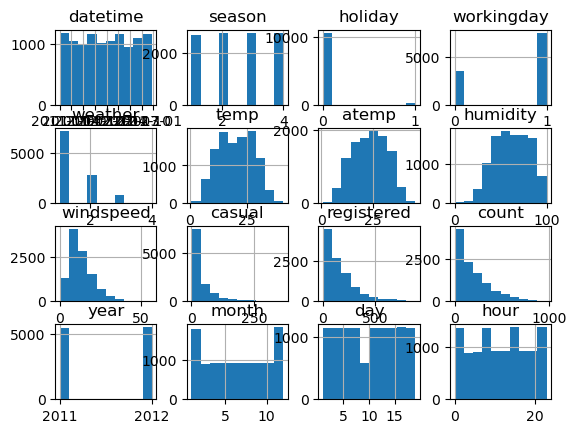

In [46]:
train.hist()

In [47]:
train['datetime'] = pd.to_datetime(train['datetime'])
test['datetime'] = pd.to_datetime(test['datetime'])

# Access year, month, and day
train['year'] = train['datetime'].dt.year
train['month'] = train['datetime'].dt.month
train['day'] = train['datetime'].dt.day
train['hour'] = train['datetime'].dt.hour

test['year'] = test['datetime'].dt.year
test['month'] = test['datetime'].dt.month
test['day'] = test['datetime'].dt.day
test['hour'] = test['datetime'].dt.hour

In [48]:
train["season"] = train["season"].astype("category")
train["weather"] = train["weather"].astype("category")
test["season"] = test["season"].astype("category")
test["weather"] = test["weather"].astype("category")

In [49]:
train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,year,month,day,hour
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16,2011,1,1,0
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40,2011,1,1,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32,2011,1,1,2
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13,2011,1,1,3
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1,2011,1,1,4


array([[<Axes: title={'center': 'datetime'}>,
        <Axes: title={'center': 'holiday'}>,
        <Axes: title={'center': 'workingday'}>,
        <Axes: title={'center': 'temp'}>],
       [<Axes: title={'center': 'atemp'}>,
        <Axes: title={'center': 'humidity'}>,
        <Axes: title={'center': 'windspeed'}>,
        <Axes: title={'center': 'casual'}>],
       [<Axes: title={'center': 'registered'}>,
        <Axes: title={'center': 'count'}>,
        <Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'month'}>],
       [<Axes: title={'center': 'day'}>,
        <Axes: title={'center': 'hour'}>, <Axes: >, <Axes: >]],
      dtype=object)

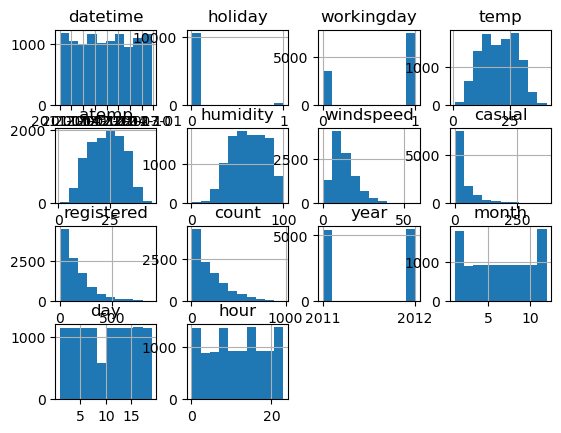

In [50]:
train.hist()

In [51]:
predictor_new_features = TabularPredictor(
    label="count", problem_type="regression", eval_metric="rmse"
    ).fit(
    train_data=train.drop(['casual', 'registered'], axis=1),
    time_limit=600,
    presets='best_quality')

No path specified. Models will be saved in: "AutogluonModels/ag-20240430_034236"
Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 600s
AutoGluon will save models to "AutogluonModels/ag-20240430_034236"
AutoGluon Version:  0.8.2
Python Version:     3.10.14
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Sat Mar 23 09:49:55 UTC 2024
Disk Space Avail:   3.81 GB / 5.36 GB (71.1%)
	We recommend a minimum available disk space of 10 GB, and large datasets may require more.
Train Data Rows:    10886
Train Data Columns: 13
Label Column: count
Preprocessing data ...
/opt/conda/lib/python3.10/site-packages/autogluon/tabular/learner/default_learner.py:215: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", 

[1000]	valid_set's rmse: 35.722
[2000]	valid_set's rmse: 34.0646
[3000]	valid_set's rmse: 33.7501
[4000]	valid_set's rmse: 33.5663
[5000]	valid_set's rmse: 33.5927
[1000]	valid_set's rmse: 36.6943
[2000]	valid_set's rmse: 34.7009
[3000]	valid_set's rmse: 34.2654
[4000]	valid_set's rmse: 34.0805
[5000]	valid_set's rmse: 34.0068
[6000]	valid_set's rmse: 33.9926
[7000]	valid_set's rmse: 34.0148
[8000]	valid_set's rmse: 34.0505
[1000]	valid_set's rmse: 37.0225
[2000]	valid_set's rmse: 34.5264
[3000]	valid_set's rmse: 33.9428
[4000]	valid_set's rmse: 33.6752
[5000]	valid_set's rmse: 33.5411
[6000]	valid_set's rmse: 33.4628
[7000]	valid_set's rmse: 33.3908
[8000]	valid_set's rmse: 33.3862
[9000]	valid_set's rmse: 33.3645
[10000]	valid_set's rmse: 33.3686
[1000]	valid_set's rmse: 38.1752
[2000]	valid_set's rmse: 36.5188
[3000]	valid_set's rmse: 36.1264
[4000]	valid_set's rmse: 35.9954
[5000]	valid_set's rmse: 35.9337
[6000]	valid_set's rmse: 35.9463
[1000]	valid_set's rmse: 38.9031
[2000]	val

	-34.4539	 = Validation score   (-root_mean_squared_error)
	73.51s	 = Training   runtime
	11.95s	 = Validation runtime
Fitting model: LightGBM_BAG_L1 ... Training model for up to 302.83s of the 502.6s of remaining time.
	Fitting 8 child models (S1F1 - S1F8) | Fitting with SequentialLocalFoldFittingStrategy


[1000]	valid_set's rmse: 33.1713
[2000]	valid_set's rmse: 33.0077
[1000]	valid_set's rmse: 32.8635
[2000]	valid_set's rmse: 32.6404
[1000]	valid_set's rmse: 31.9543
[2000]	valid_set's rmse: 31.343
[3000]	valid_set's rmse: 30.9039
[4000]	valid_set's rmse: 30.8612
[1000]	valid_set's rmse: 35.8483
[2000]	valid_set's rmse: 35.4773
[3000]	valid_set's rmse: 35.3993
[1000]	valid_set's rmse: 35.5388
[1000]	valid_set's rmse: 31.6283
[1000]	valid_set's rmse: 37.9327
[2000]	valid_set's rmse: 37.4577
[1000]	valid_set's rmse: 34.9434
[2000]	valid_set's rmse: 34.6719


	-33.9173	 = Validation score   (-root_mean_squared_error)
	25.25s	 = Training   runtime
	3.05s	 = Validation runtime
Fitting model: RandomForestMSE_BAG_L1 ... Training model for up to 271.09s of the 470.86s of remaining time.
	-38.425	 = Validation score   (-root_mean_squared_error)
	16.73s	 = Training   runtime
	0.57s	 = Validation runtime
Fitting model: CatBoost_BAG_L1 ... Training model for up to 253.37s of the 453.14s of remaining time.
	Fitting 8 child models (S1F1 - S1F8) | Fitting with SequentialLocalFoldFittingStrategy
	Ran out of time, early stopping on iteration 2589.
	Ran out of time, early stopping on iteration 2730.
	Ran out of time, early stopping on iteration 2714.
	Ran out of time, early stopping on iteration 2814.
	Ran out of time, early stopping on iteration 3062.
	Ran out of time, early stopping on iteration 3113.
	Ran out of time, early stopping on iteration 3355.
	Ran out of time, early stopping on iteration 3689.
	-34.056	 = Validation score   (-root_mean_squared

[1000]	valid_set's rmse: 30.095
[1000]	valid_set's rmse: 30.9622


	-31.1534	 = Validation score   (-root_mean_squared_error)
	15.13s	 = Training   runtime
	0.71s	 = Validation runtime
Fitting model: LightGBM_BAG_L2 ... Training model for up to 182.32s of the 182.3s of remaining time.
	Fitting 8 child models (S1F1 - S1F8) | Fitting with SequentialLocalFoldFittingStrategy
	-30.6569	 = Validation score   (-root_mean_squared_error)
	10.26s	 = Training   runtime
	0.26s	 = Validation runtime
Fitting model: RandomForestMSE_BAG_L2 ... Training model for up to 171.42s of the 171.41s of remaining time.
	-31.678	 = Validation score   (-root_mean_squared_error)
	40.14s	 = Training   runtime
	0.61s	 = Validation runtime
Fitting model: CatBoost_BAG_L2 ... Training model for up to 130.24s of the 130.22s of remaining time.
	Fitting 8 child models (S1F1 - S1F8) | Fitting with SequentialLocalFoldFittingStrategy
	Ran out of time, early stopping on iteration 1275.
	Ran out of time, early stopping on iteration 1242.
	-30.4785	 = Validation score   (-root_mean_squared_err

In [52]:
predictor_new_features.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                     model   score_val  pred_time_val    fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0      WeightedEnsemble_L3  -30.229371      17.975116  553.563776                0.000632           0.319943            3       True         14
1          CatBoost_BAG_L2  -30.478472      16.387324  487.721086                0.057159         120.831526            2       True         12
2          LightGBM_BAG_L2  -30.656909      16.592012  377.147769                0.261847          10.258209            2       True         10
3        LightGBMXT_BAG_L2  -31.153360      17.044061  382.018803                0.713896          15.129243            2       True          9
4     ExtraTreesMSE_BAG_L2  -31.488288      17.083068  379.207504                0.752903          12.317944            2       True         13
5   RandomForestMSE_BAG_L2  -31.678040      16.941582  407.024855         

/opt/conda/lib/python3.10/site-packages/autogluon/core/utils/plots.py:169: UserWarning: AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"
  warnings.warn('AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"')


{'model_types': {'KNeighborsUnif_BAG_L1': 'StackerEnsembleModel_KNN',
  'KNeighborsDist_BAG_L1': 'StackerEnsembleModel_KNN',
  'LightGBMXT_BAG_L1': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1': 'StackerEnsembleModel_LGB',
  'RandomForestMSE_BAG_L1': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesMSE_BAG_L1': 'StackerEnsembleModel_XT',
  'WeightedEnsemble_L2': 'WeightedEnsembleModel',
  'LightGBMXT_BAG_L2': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L2': 'StackerEnsembleModel_LGB',
  'RandomForestMSE_BAG_L2': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L2': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesMSE_BAG_L2': 'StackerEnsembleModel_XT',
  'WeightedEnsemble_L3': 'WeightedEnsembleModel'},
 'model_performance': {'KNeighborsUnif_BAG_L1': -101.54619908446061,
  'KNeighborsDist_BAG_L1': -84.12506123181602,
  'LightGBMXT_BAG_L1': -34.453884062670745,
  'LightGBM_BAG_L1': -33.91733862651761,
  'RandomForestMSE_BAG_L1': -38.424983594881716,


In [53]:
predictions_new_features = predictor_new_features.predict(test)
predictions_new_features = {'datetime': test['datetime'], 'Pred_count': predictions_new_features}
predictions_new_features = pd.DataFrame(data=predictions_new_features)
predictions_new_features.head()

,datetime,Pred_count
0,2011-01-20 00:00:00,16.358873
1,2011-01-20 01:00:00,11.384792
2,2011-01-20 02:00:00,10.392972
3,2011-01-20 03:00:00,9.292883
4,2011-01-20 04:00:00,7.534829


In [54]:
predictions_new_features[predictions_new_features['Pred_count']<0] = 0

In [55]:
predictions_new_features.describe()

,datetime,Pred_count
count,6493,6493.000000
mean,2012-01-13 09:27:47.765285632,153.902969
min,2011-01-20 00:00:00,1.313361
25%,2011-07-22 15:00:00,54.035172
50%,2012-01-20 23:00:00,119.526962
75%,2012-07-20 17:00:00,218.603973
max,2012-12-31 23:00:00,820.556641
std,NaN,132.769485


In [56]:
# Same submitting predictions
submission_new_features = pd.read_csv('submission.csv')
submission_new_features["count"] = predictions_new_features['Pred_count']
submission_new_features.to_csv("submission_new_features.csv", index=False)

In [44]:
!kaggle competitions submit -c bike-sharing-demand -f submission_new_features.csv -m "new features"

100%|█████████████████████████████████████████| 188k/188k [00:00<00:00, 576kB/s]
Successfully submitted to Bike Sharing Demand

In [45]:
!kaggle competitions submissions -c bike-sharing-demand | tail -n +1 | head -n 6

fileName                     date                 description           status    publicScore  privateScore  
---------------------------  -------------------  --------------------  --------  -----------  ------------  
submission_new_features.csv  2024-04-30 02:37:04  new features          pending                              
submission.csv               2024-04-30 02:20:52  first raw submission  complete  1.80512      1.80512       
submission_new_features.csv  2024-04-28 22:14:56  new features          complete  0.65798      0.65798       
submission.csv               2024-04-28 22:02:47  first raw submission  complete  1.84007      1.84007       


In [57]:
import autogluon.core as ag

nn_options = {  # specifies non-default hyperparameter values for neural network models
    'num_epochs': 10,  # number of training epochs (controls training time of NN models)
    'learning_rate': ag.space.Real(1e-4, 1e-2, default=5e-4, log=True),  # learning rate used in training (real-valued hyperparameter searched on log-scale)
    'activation': ag.space.Categorical('relu', 'softrelu', 'tanh'),  # activation function used in NN (categorical hyperparameter, default = first entry)
    'layers': ag.space.Categorical([100], [1000], [200, 100], [300, 200, 100]),  # each choice for categorical hyperparameter 'layers' corresponds to list of sizes for each NN layer to use
    'dropout_prob': ag.space.Real(0.0, 0.5, default=0.1),  # dropout probability (real-valued hyperparameter)
}

gbm_options = {  # specifies non-default hyperparameter values for lightGBM gradient boosted trees
    'num_boost_round': 100,  # number of boosting rounds (controls training time of GBM models)
    'num_leaves': ag.space.Int(lower=26, upper=66, default=36),  # number of leaves in trees (integer hyperparameter)
}

hyperparameters = {  # hyperparameters of each model type
                   'GBM': gbm_options,
                   #'NN': nn_options,  # NOTE: comment this line out if you get errors on Mac OSX
                  }  # When these keys are missing from hyperparameters dict, no models of that type are trained

#num_trials = 5  # try at most 5 different hyperparameter configurations for each type of model
search_strategy = 'auto'  # to tune hyperparameters using Bayesian optimization routine with a local scheduler
hyperparameter_tune_kwargs = {  # HPO is not performed unless hyperparameter_tune_kwargs is specified
    #'num_trials': num_trials,
    'scheduler' : 'local',
    'searcher': search_strategy,
}

predictor_new_hpo = TabularPredictor(label="count", eval_metric="root_mean_squared_error",learner_kwargs={"ignored_columns":
["casual", "registered"]}).fit(train_data=train, time_limit=600, presets="best_quality", hyperparameters=hyperparameters, hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
)

No path specified. Models will be saved in: "AutogluonModels/ag-20240430_035402"
Presets specified: ['best_quality']
/opt/conda/lib/python3.10/site-packages/autogluon/core/utils/utils.py:564: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):  # treat None, NaN, INF, NINF as NA
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 600s
AutoGluon will save models to "AutogluonModels/ag-20240430_035402"
AutoGluon Version:  0.8.2
Python Version:     3.10.14
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Sat Mar 23 09:49:55 UTC 2024
Disk Space Avail:   2.47 GB / 5.36 GB (46.1%)
	We recommend a minimum available disk space of 10 GB, and large datasets may require more.
Train Data Rows:    10886
Train Data Columns: 15
Label Column: c

In [58]:
predictor_new_hpo.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                  model   score_val  pred_time_val    fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0   WeightedEnsemble_L3  -33.898886       0.010503  407.617138                0.000579           0.265508            3       True         95
1    LightGBM_BAG_L2/T7  -34.096427       0.009594  365.179346                0.000089          11.569162            2       True         88
2   LightGBM_BAG_L2/T13  -34.124900       0.009602  367.799219                0.000097          14.189035            2       True         94
3    LightGBM_BAG_L2/T1  -34.140293       0.009596  370.022974                0.000090          16.412791            2       True         82
4    LightGBM_BAG_L2/T2  -34.161413       0.009652  366.456404                0.000146          12.846220            2       True         83
5   LightGBM_BAG_L2/T10  -34.192016       0.009598  366.523458                0.000093      

/opt/conda/lib/python3.10/site-packages/autogluon/core/utils/plots.py:169: UserWarning: AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"
  warnings.warn('AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"')


{'model_types': {'LightGBM_BAG_L1/T1': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T2': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T3': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T4': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T5': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T6': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T7': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T8': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T9': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T10': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T11': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T12': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T13': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T14': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T15': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T16': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T17': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T18': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1/T19': 'StackerEnsembl

In [59]:
new_predictions_hpo = predictor_new_hpo.predict(test)
new_predictions_hpo[new_predictions_hpo<0] = 0

In [60]:
# Same submitting predictions
submission_new_hpo = pd.read_csv("submission.csv", parse_dates=["datetime"])
submission_new_hpo["count"] = new_predictions_hpo
submission_new_hpo.to_csv("submission_new_hpo.csv", index=False)

In [61]:
!kaggle competitions submit -c bike-sharing-demand -f submission_new_hpo.csv -m "new features with hyperparameters"

100%|█████████████████████████████████████████| 188k/188k [00:00<00:00, 673kB/s]
Successfully submitted to Bike Sharing Demand

In [62]:
!kaggle competitions submissions -c bike-sharing-demand | tail -n +1 | head -n 6

fileName                     date                 description                        status    publicScore  privateScore  
---------------------------  -------------------  ---------------------------------  --------  -----------  ------------  
submission_new_hpo.csv       2024-04-30 04:04:03  new features with hyperparameters  complete  0.47887      0.47887       
submission.csv               2024-04-30 03:42:29  first raw submission               complete  1.80337      1.80337       
submission_new_hpo.csv       2024-04-30 02:53:22  new features with hyperparameters  complete  0.48188      0.48188       
submission_new_features.csv  2024-04-30 02:37:04  new features                       complete  0.6741       0.6741        


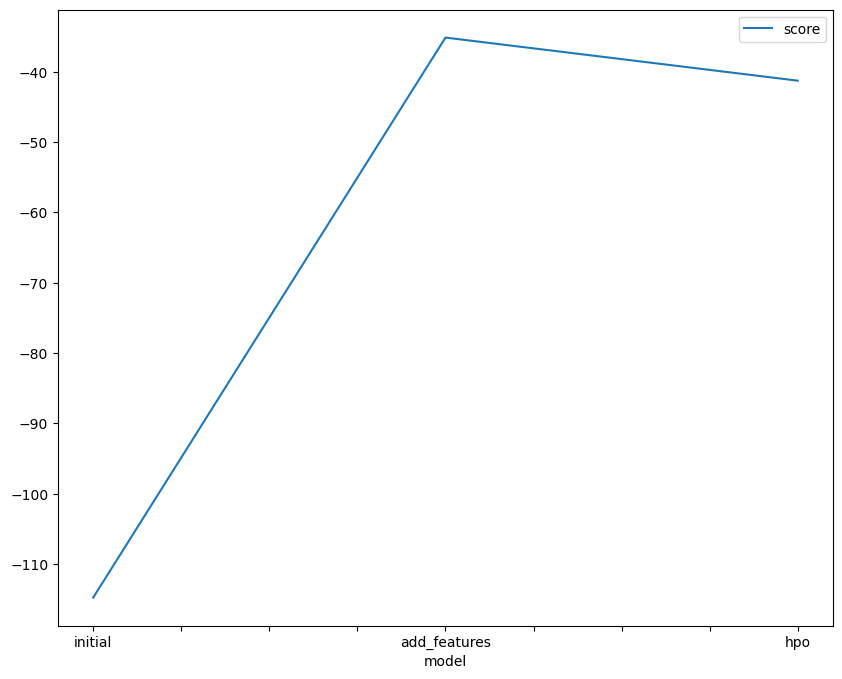

In [63]:
fig = pd.DataFrame(
    {
        "model": ["initial", "add_features", "hpo"],
        "score": [-114.766567, -35.146287, -41.271647]
    }
).plot(x="model", y="score", figsize=(10, 8)).get_figure()
fig.savefig('model_train_score.png')

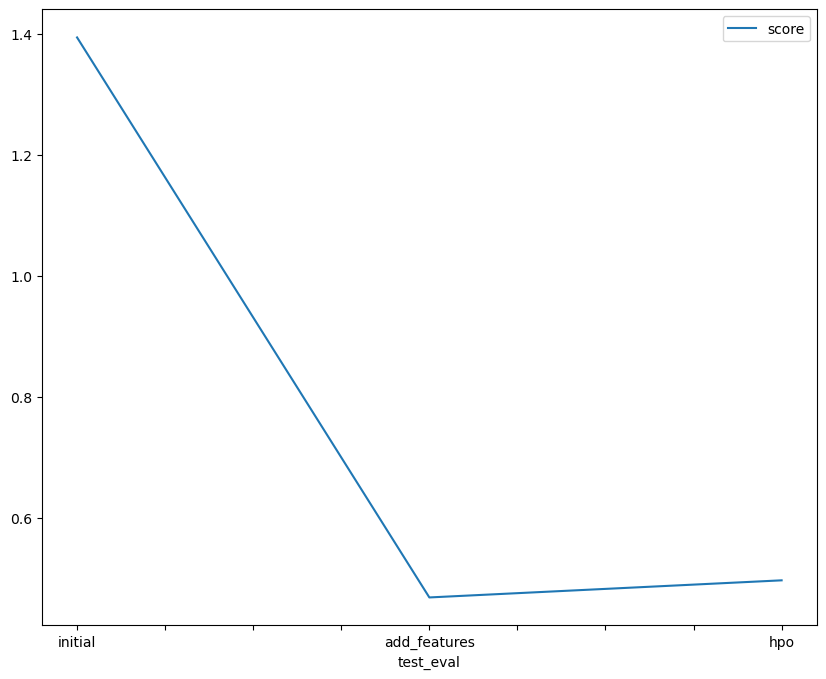

In [64]:
# Take the 3 kaggle scores and creating a line plot to show improvement
fig = pd.DataFrame(
    {
        "test_eval": ["initial", "add_features", "hpo"],
        "score": [1.39373, 0.46870, 0.49696]
    }
).plot(x="test_eval", y="score", figsize=(10, 8)).get_figure()
fig.savefig('model_test_score.png')

In [65]:
pd.DataFrame({
    "model": ["initial", "add_features", "hpo"],
    "timelimit": ["time_limit = 600", "time_limit=600", "time_limit=600"],
    "presets": ["presets='best_quality'", "presets='best_quality'", "presets='best_quality'"],
    "hp-method": ["none", "problem_type = 'regression'", "tabular autogluon"],
    "score": ["1.39373", "0.46870", "0.49696"]
})

,model,timelimit,presets,hp-method,score
0,initial,time_limit = 600,presets='best_quality',none,1.39373
1,add_features,time_limit=600,presets='best_quality',problem_type = 'regression',0.46870
2,hpo,time_limit=600,presets='best_quality',tabular autogluon,0.49696


In [66]:
def plot_series(time, series, format="-", start=0, end=None, label=None):
    plt.plot(time[start:end], series[start:end], format, label=label)
    plt.xlabel("Time")
    plt.ylabel("Value")
    if label:
        plt.legend(fontsize=14)
    plt.grid(True)

In [67]:
sub_new = pd.read_csv('submission_new_features.csv')

In [ ]:
import matplotlib.pyplot as plt
series = train["count"].to_numpy()
time = train["datetime"].to_numpy()


plt.figure(figsize=(350, 50))
plot_series(time, series)
plt.title("Train Data time series graph")
#plot_series(time1, series1)
plt.show()

In [69]:
sub_new.loc[:, "datetime"] = pd.to_datetime(sub_new.loc[:, "datetime"])

series1 = sub_new["count"].to_numpy()
time1 = sub_new["datetime"].to_numpy()

plt.figure(figsize=(400, 50))
#plot_series(time, series)
plot_series(time1, series1)
plt.title("Test Data time series graph")
plt.show()

In [71]:
import xgboost as xgb

In [72]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [75]:

train_df['datetime'] = pd.to_datetime(train['datetime'])
test_df['datetime'] = pd.to_datetime(test['datetime'])

train_df['year'] = train_df['datetime'].dt.year
train_df['month'] = train_df['datetime'].dt.month
train_df['day'] = train_df['datetime'].dt.day
train_df['hour'] = train_df['datetime'].dt.hour

test_df['year'] = test_df['datetime'].dt.year
test_df['month'] = test_df['datetime'].dt.month
test_df['day'] = test_df['datetime'].dt.day
test_df['hour'] = test_df['datetime'].dt.hour

In [76]:
trainxgb = train_df.drop(['casual', 'registered','count', 'datetime'], axis=1)
trainxgb.head()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,year,month,day,hour
0,1,0,0,1,9.84,14.395,81,0.0,2011,1,1,0
1,1,0,0,1,9.02,13.635,80,0.0,2011,1,1,1
2,1,0,0,1,9.02,13.635,80,0.0,2011,1,1,2
3,1,0,0,1,9.84,14.395,75,0.0,2011,1,1,3
4,1,0,0,1,9.84,14.395,75,0.0,2011,1,1,4


In [77]:
countxgb = train_df['count']
countxgb.head()

0    16
1    40
2    32
3    13
4     1
Name: count, dtype: int64

In [78]:
train_xgb = xgb.DMatrix(
    trainxgb, countxgb
)

params = {"objective": "reg:linear"} 
bst = xgb.train(params, train_xgb)

bst.predict(train_xgb)

[04:08:41] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1700181168148/work/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


array([ 35.479843,  31.946043,  25.44875 , ..., 185.26509 , 141.68748 ,
       111.29078 ], dtype=float32)

In [79]:
!jupyter nbconvert --to html pro.ipynb

[NbConvertApp] WARNING | pattern 'bike_sharing.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
  